# Python Project: pillow, tesseract, and opencv 
## UNIVERSITY OF MICHIGAN - COURSERA 

1) In week one the video lectures will introduce the python PILLOW module, and you will see how to manipulate images in the Jupyter notebooks.

- To do this project, I am using Windows 10 and WSL (Ubuntu)
- By opening the ubuntu terminal, I installed miniconda, than `conda install jupyterlab`
- I created a new env in conda: named OCR_project 
- After, I activated the env 
- I intalled the `pillow`, `pytesseract`, `numpy`, `matplotib` libs

In [1]:
!pip install pillow

In [2]:
!pip install pytesseract

In [3]:
!pip install numpy

In [4]:
!pip install matplotlib

In [5]:
!pip install opencv-python

## Getting an image from the internet

In [6]:
import requests

image_url = 'https://www.worldatlas.com/r/w960-q80/upload/8b/a2/bb/shutterstock-665814145.jpg'
img = requests.get(image_url).content
with open('waterfall.jpg', 'wb') as handler:
    handler.write(img)

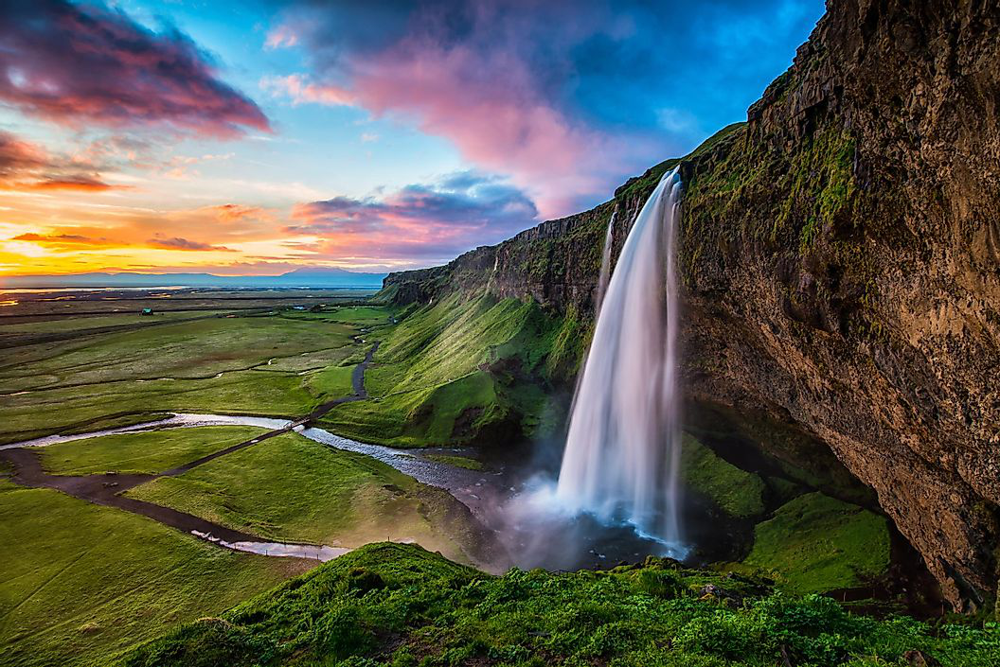

In [7]:
import PIL
from PIL import Image

# read image and convert to RGB
image=Image.open('waterfall.jpg').convert('RGB')

display(image)

In [8]:
import inspect

help(inspect.getmro)

Help on function getmro in module inspect:

getmro(cls)
    Return tuple of base classes (including cls) in method resolution order.



In [9]:
inspect.getmro(type(image))

(PIL.Image.Image, object)

In [10]:
#help(image.save)
help(image.copy)

Help on method copy in module PIL.Image:

copy() method of PIL.Image.Image instance
    Copies this image. Use this method if you wish to paste things
    into an image, but still retain the original.
    
    :rtype: :py:class:`~PIL.Image.Image`
    :returns: An :py:class:`~PIL.Image.Image` object.



Blurred image


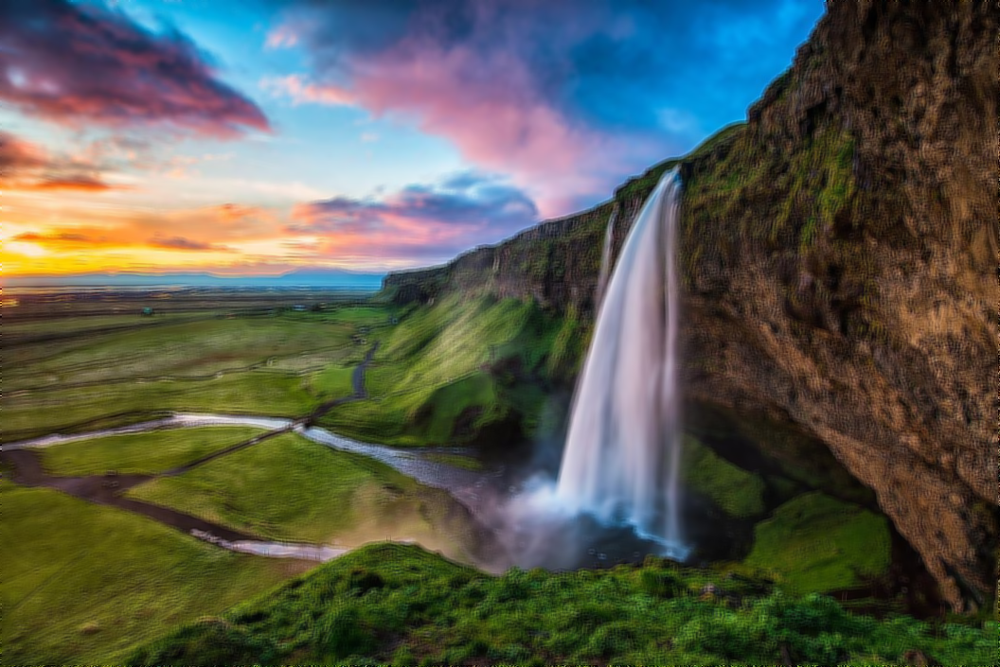

Contourred image:


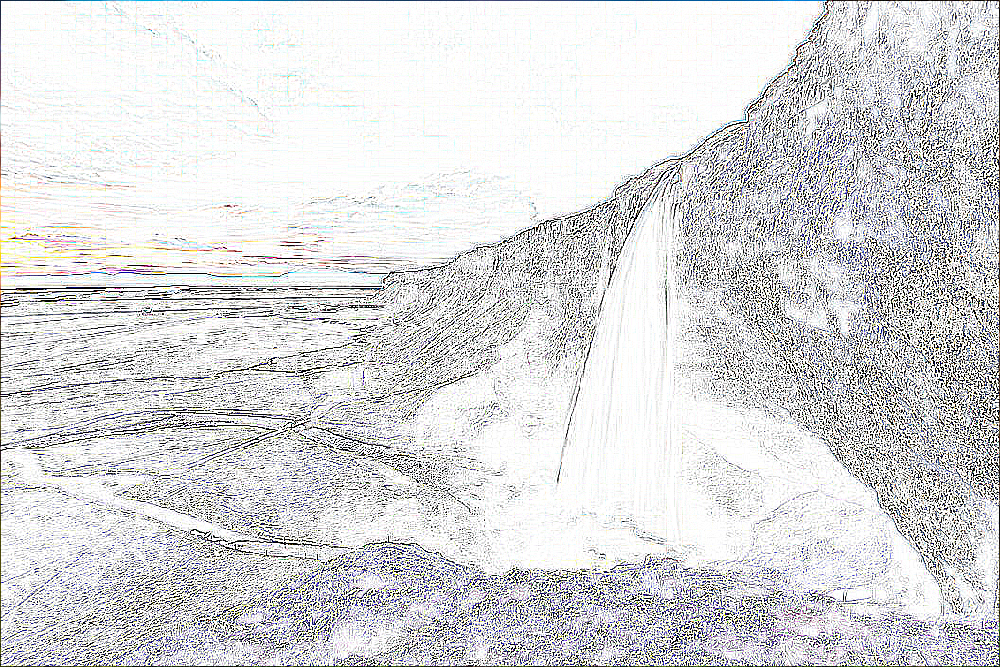

Detailed image:


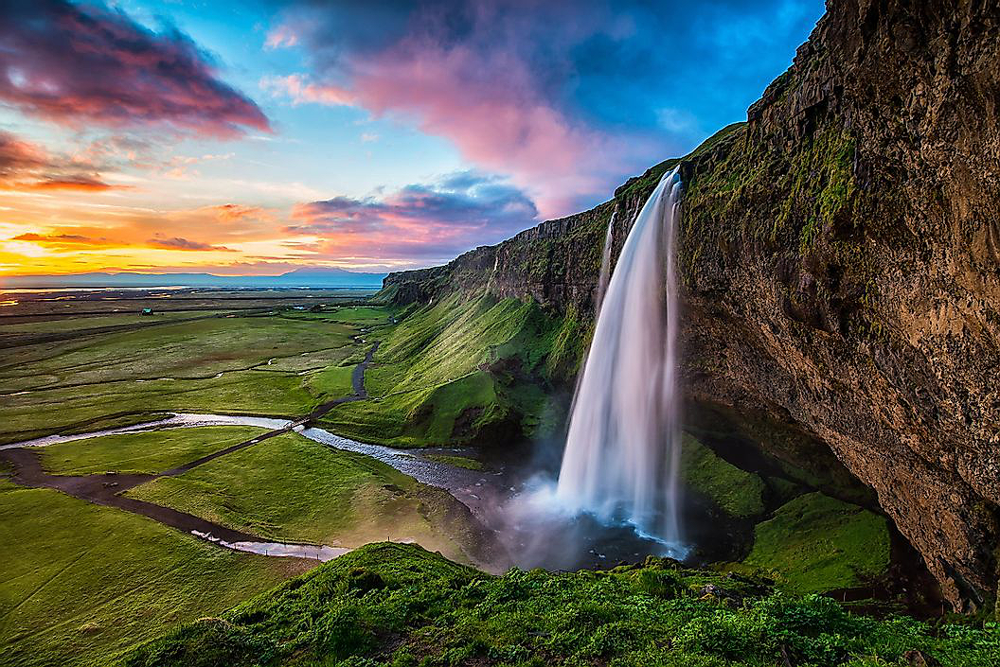

Edge Enhanced More image:


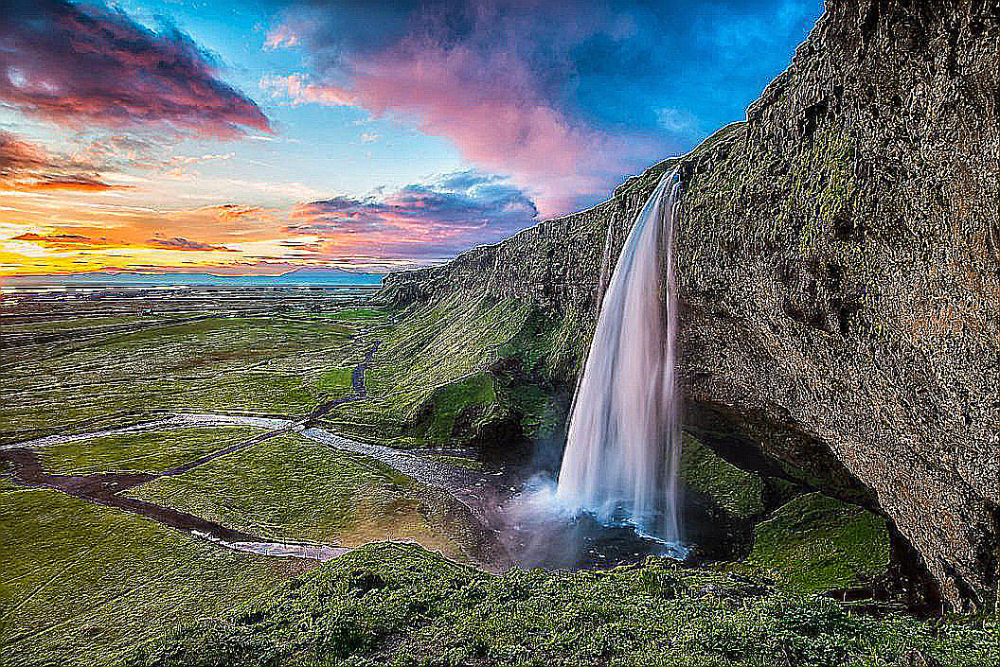

In [11]:
from PIL import ImageFilter

# testing different built-in filters
#1) blurred:
image_blur = image.filter(PIL.ImageFilter.BLUR)
print('Blurred image')
display(image_blur)

#2) contour:
image_contour = image.filter(PIL.ImageFilter.CONTOUR)
print('Contourred image:')
display(image_contour)

#3) detail:
image_detail = image.filter(PIL.ImageFilter.DETAIL)
print('Detailed image:')
display(image_detail)

#4) edge enhanced more:
image_edge_enh = image.filter(PIL.ImageFilter.EDGE_ENHANCE_MORE)
print('Edge Enhanced More image:')
display(image_edge_enh)

Embossed image


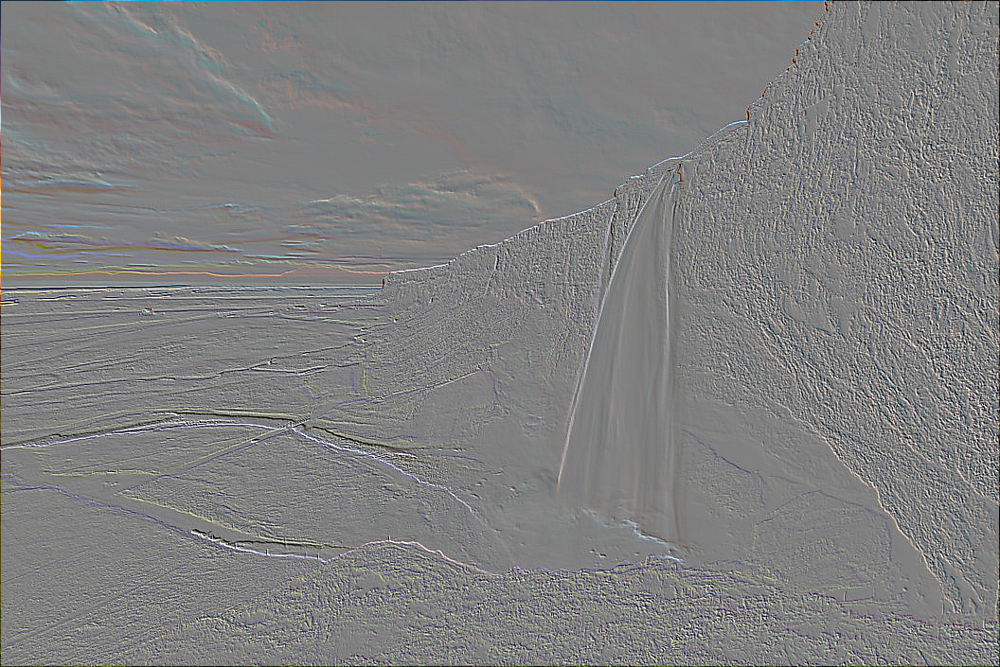

Sharpened image:


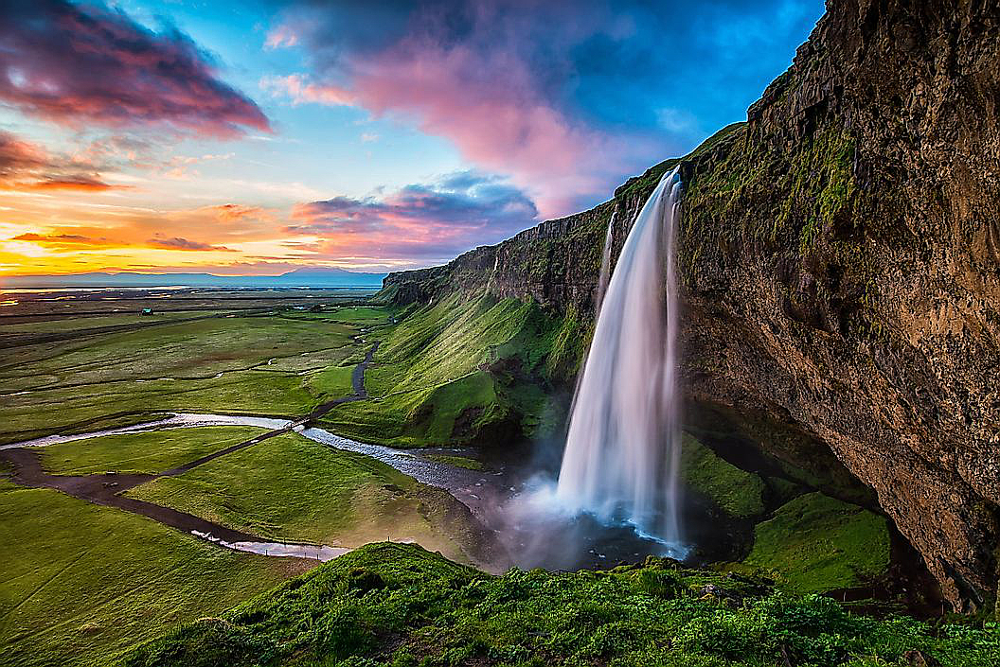

Smoothed image:


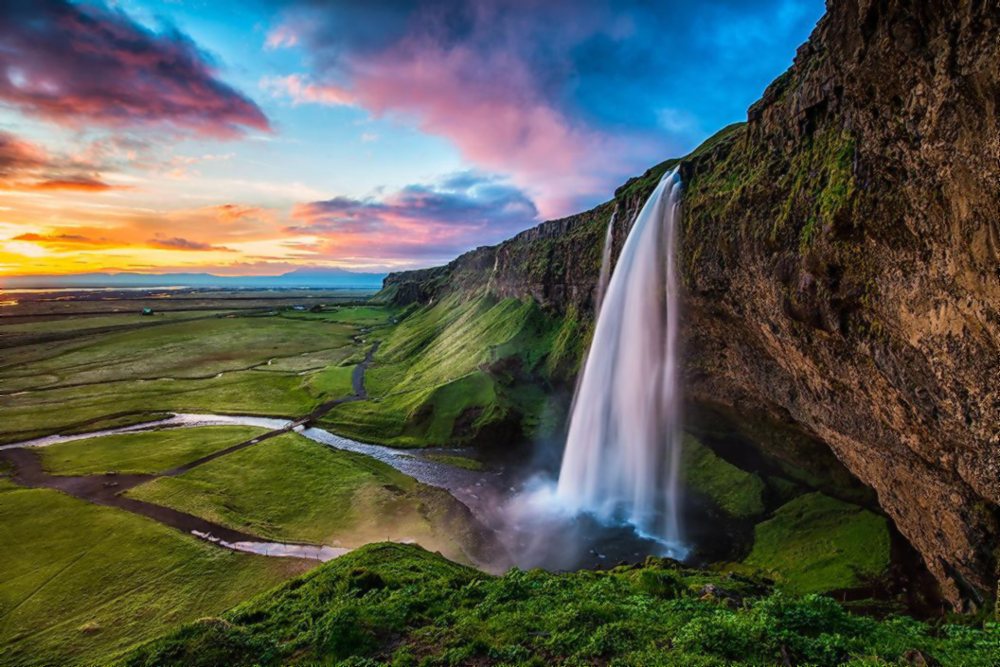

Box Blur image:


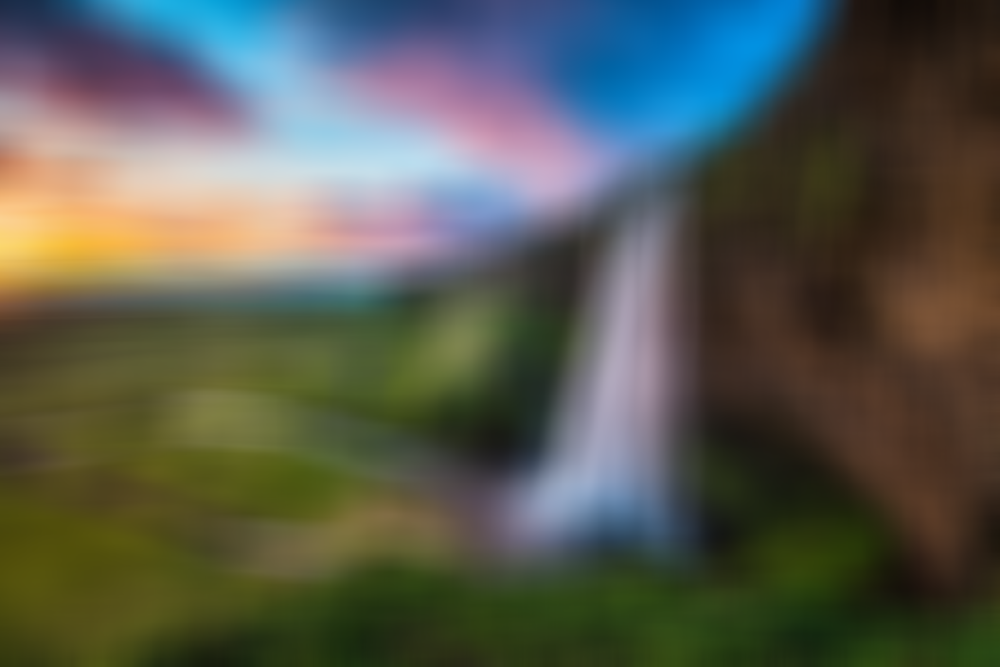

In [12]:
# testing more built-in filters
#5) Emboss:
image_emboss = image.filter(PIL.ImageFilter.EMBOSS)
print('Embossed image')
display(image_emboss)

#2) Sharpen:
image_sharpen = image.filter(PIL.ImageFilter.SHARPEN)
print('Sharpened image:')
display(image_sharpen)

#3) Smooth more:
image_smooth_more = image.filter(PIL.ImageFilter.SMOOTH_MORE)
print('Smoothed image:')
display(image_smooth_more)

#4) Box blur:
image_box_blur = image.filter(PIL.ImageFilter.BoxBlur(30))
print('Box Blur image:')
display(image_box_blur)

Gaussian Blur r=3:


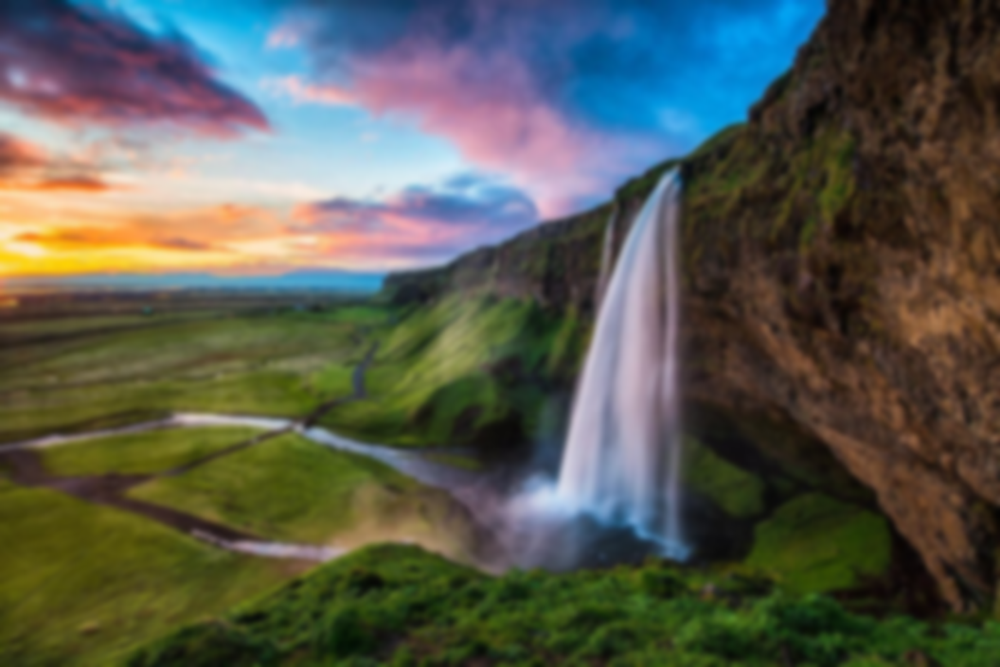

In [13]:
# testing more filters
#5) Gaussian blur:
image_gaussian = image.filter(PIL.ImageFilter.GaussianBlur(radius=3))
print('Gaussian Blur r=3:')
display(image_gaussian)

Trying rank filter:


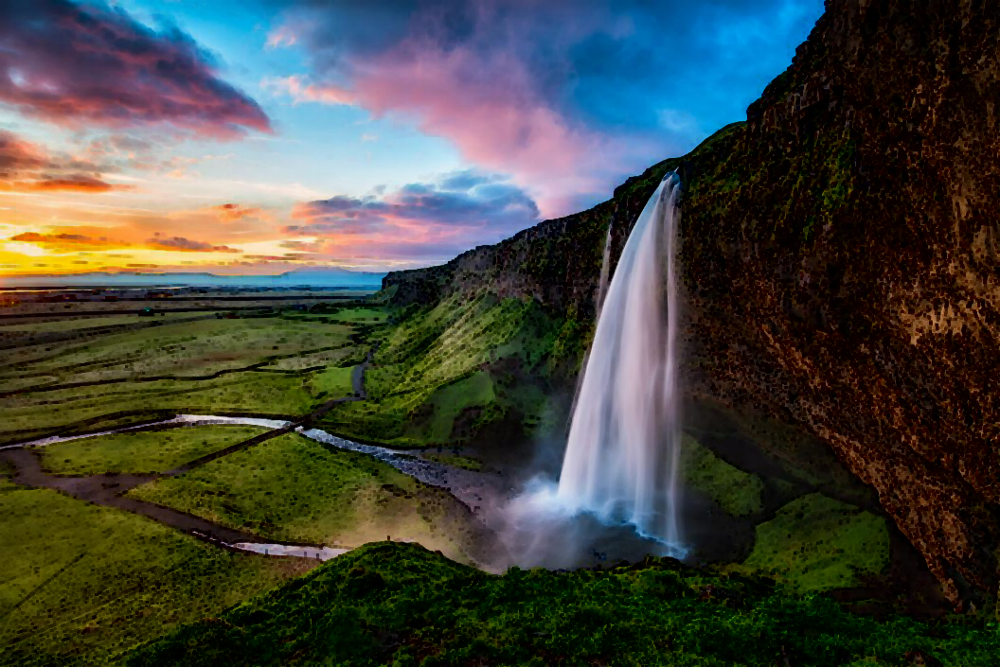

In [14]:
print("Trying rank filter:")
image.filter(PIL.ImageFilter.RankFilter(3, 0))

In [15]:
# Details from the image:

print(f"{image.width} x {image.height}")

1056 x 705


# How can we crop an image? 
- we need to pass the exact coordinates (left, top, right, bottom)
- But this is really hard to do it by hand...
- So we can use an Widget available in Jupyter: 
## `interact` decorator!

In [16]:
!pip install ipywidgets

In [17]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


### The widget did not work, but looking up at the [documentation](https://ipywidgets.readthedocs.io/en/latest/user_install.html) I found the next two commands:

Using conda environments, install nodejs with:

`conda install -c conda-forge nodejs`

Then install the labextension:

`jupyter labextension install @jupyter-widgets/jupyterlab-manager`

This solver my problem. Now, we can see the interactive tool to find out the best place to crop or draw :)

In [18]:
from ipywidgets import interact
from PIL import ImageDraw

In [20]:
@interact(left=300, top=130, right=500, bottom=500)
# writing the function to draw the border:
def draw_border(left, top, right, bottom):
    img=image.copy()
    drawing_object=ImageDraw.Draw(img)
    drawing_object.rectangle((left,top,right,bottom), fill = None, outline ='red')
    display(img)

interactive(children=(IntSlider(value=300, description='left', max=900, min=-300), IntSlider(value=130, descri…

# Using Interactive widget: 
- by using the buttons to move the rectangle along the image, we can find the coordinate that correspond to the wanted spot from the image.
- waterfall: **(left=440, top=143, right=790, bottom=644)**

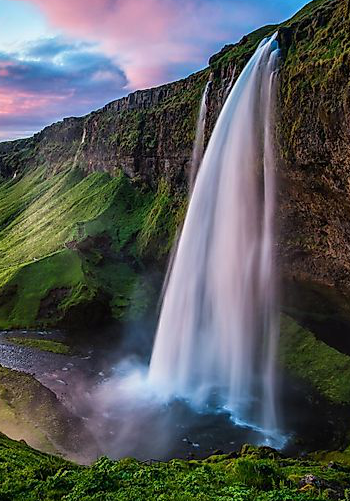

In [31]:
import PIL
from PIL import Image
from IPython.display import display
image = Image.open('waterfall.jpg').convert('RGB')
box=(440,143,790,644)
waterfall = image.crop(box)

display(waterfall)